In [63]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt



### Notes
#### Offset: 
- When combining both types of trailers, anterior insula shows a significant positive correlation with negative arousal (r=0.17489; p-value=1.7246341016483672e-06). Also, anterior insual shows a negative correlation with watch scores (r=-0.07491; p-value=0.04175856809627057).
- For horror trailers alone, NAcc has a significant positive correlation with positive arousal (r=0.15077; p-value= 0.003743392014030906); AIns has a significant positive correlation with negative arousal (r=0.13562; p-value=0.009192194315207748). 
- For comedy trailers alone, NAcc has a significant negative correlation with positive arousal (r=-0.11963; p-value=0.021179442433856898). Also, NAcc is negatively correlated with watch scores (r=0.10155; p-value=0.050637663806451946).
#### Positive peak: 
- When combining both trailers, the positive peak of AIns is positively correlated with negative arousal (r=0.092; p-value=0.01235140998911575)
#### Negative peak: 


- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.
- Reality check with V1 for all subjects.


# Homemade functions

In [64]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [65]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [66]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [67]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

# Clean data

In [68]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [69]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_events_df.shape

(804, 50)

In [70]:
# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.8]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -1.23]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)





The shape of the dataframe before dropping outliers is:  (804, 50)
The shape of the dataframe after dropping 'positive arousal' outliers is:  (802, 50)
The shape of the dataframe after dropping 'negative arousal' outliers is:  (801, 50)
The shape of the dataframe after dropping 'NAcc' outliers is:  (797, 50)
The shape of the dataframe after dropping 'AIns' outliers is:  (795, 50)


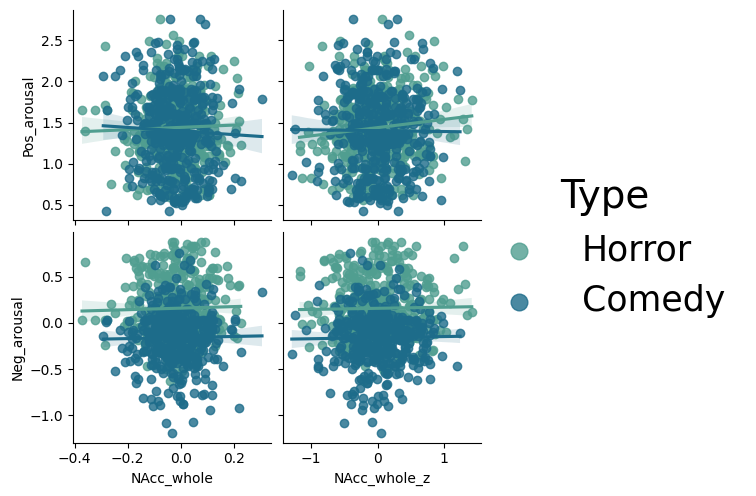

In [71]:
sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["NAcc_whole", "NAcc_whole_z"],
    y_vars=["Pos_arousal", "Neg_arousal"], 
    hue="Type",
    palette="crest")

In [72]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


# Visualize data 

## Behavioral Associations. 

In [73]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score"], all_subs_events_df["Pos_arousal"])
A_PA_All_corr = pearsonr(all_subs_events_df["A_score"], all_subs_events_df["Pos_arousal"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between A_score and Pos_arousal is: " + str(round(A_PA_All_corr[0], 4)) + " with a p-value of: " + str((A_PA_All_corr[1])))


The correlation between W_score and Pos_arousal is: 0.789 with a p-value of: 6.310173500546242e-170
The correlation between A_score and Pos_arousal is: 0.6649 with a p-value of: 1.3847552714015006e-102


In [74]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score"], all_subs_events_comedy["Pos_arousal"])
A_PA_comedy_corr = pearsonr(all_subs_events_comedy["A_score"], all_subs_events_comedy["Pos_arousal"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between A_score and Pos_arousal for comedy trailers is: " + str(round(A_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((A_PA_comedy_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.8698 with a p-value of: 6.885085150628183e-124
The correlation between A_score and Pos_arousal for comedy trailers is: 0.7497 with a p-value of: 3.6511016733349935e-73


In [75]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score"], all_subs_events_horror["Pos_arousal"])
A_PA_horror_corr = pearsonr(all_subs_events_horror["A_score"], all_subs_events_horror["Pos_arousal"])

print("The correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between A_score and Pos_arousal for horror trailers is: " + str(round(A_PA_horror_corr[0], 4)) + " with a p-value of: " + str((A_PA_horror_corr[1])))

The correlation between W_score and Pos_arousal for horror trailers is: 0.7437 with a p-value of: 6.5987418585016754e-71
The correlation between A_score and Pos_arousal for horror trailers is: 0.6222 with a p-value of: 8.198474317682808e-44


## Neural Activation Whole Average 

In [76]:
# Correlation with Positive Arousal. 
NAcc_PA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores. 
NAcc_W_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["W_score_scaled"])
AIns_W_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["W_score_scaled"])
MPFC_W_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_All_corr[1])))


For both types of trailers, the correlation between NAcc whole activation and positive arousal is: -0.0059 with a p-value of: 0.8681582066682881
For both types of trailers, the correlation between AIns whole activation and positive arousal is: -0.00028 with a p-value of: 0.993620451640127
For both types of trailers, the correlation between MPFC whole activation and positive arousal is: -0.08088 with a p-value of: 0.02257754932467259

For both types of trailers, the correlation between NAcc whole activation and negative arousal is: 0.01767 with a p-value of: 0.6189529689588946
For both types of trailers, the correlation between AIns whole activation and negative arousal is: 0.16922 with a p-value of: 1.5983936382594695e-06
For both types of trailers, the correlation between MPFC whole activation and negative arousal is: 0.00625 with a p-value of: 0.8602519123448344

For both types of trailers, the correlation between NAcc whole activation and watch scores is: -0.00605 with a p-value of:

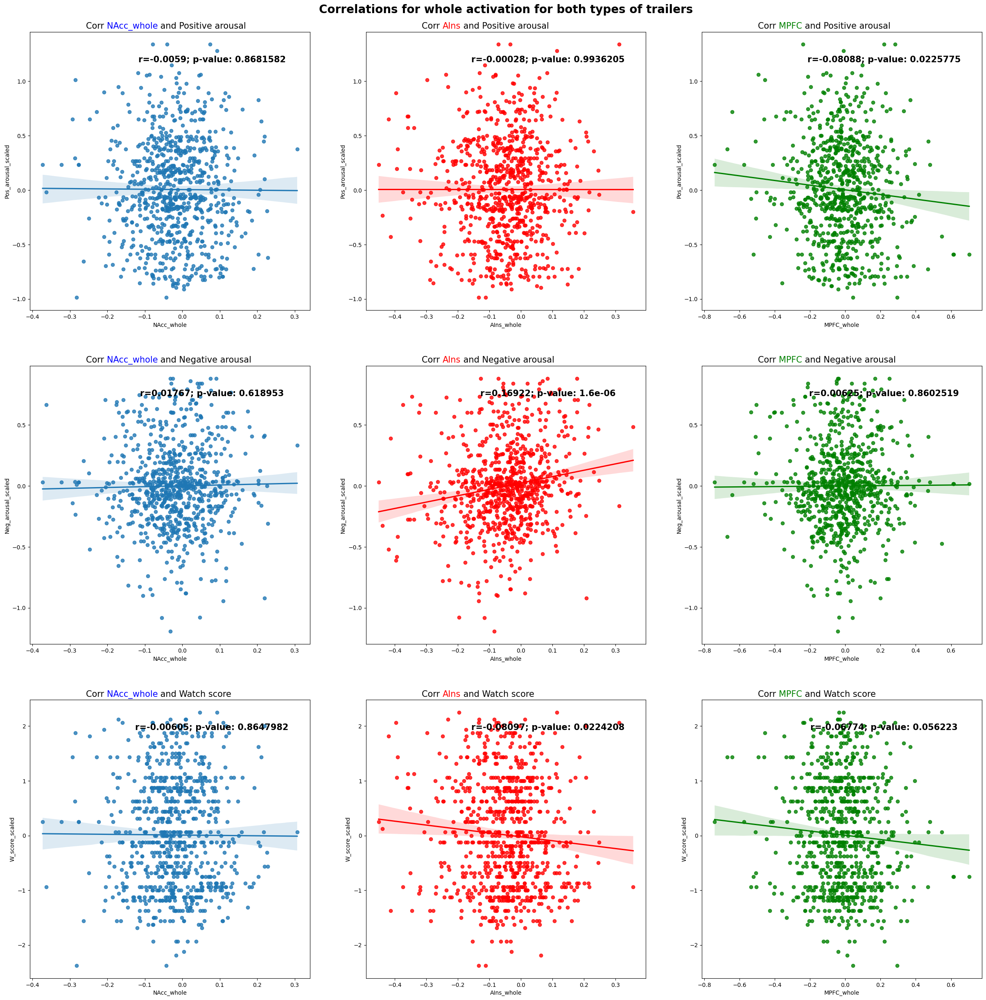

In [77]:
whole_all_corr = [NAcc_PA_whole_All_corr, NAcc_NA_whole_All_corr, NAcc_W_whole_All_corr, AIns_PA_whole_All_corr, AIns_NA_whole_All_corr, AIns_W_whole_All_corr, MPFC_PA_whole_All_corr, MPFC_NA_whole_All_corr, MPFC_W_whole_All_corr]

plot_correlations(all_subs_events_df, whole_all_corr, "whole", "Correlations for whole activation for both types of trailers")

In [78]:
# Whole Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["W_score_scaled"])
AIns_W_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_C_corr[1])))
      
      

For comedy trailers, the correlation between NAcc whole activation and positive arousal is: -0.03776 with a p-value of: 0.45194923528691944
For comedy trailers, the correlation between AIns whole activation and positive arousal is: -0.04569 with a p-value of: 0.3627211577550407
For comedy trailers, the correlation between MPFC whole activation and positive arousal is: -0.12578 with a p-value of: 0.011920874688262641

For comedy trailers, the correlation between NAcc whole activation and negative arousal is: 0.01689 with a p-value of: 0.7366124707876887
For comedy trailers, the correlation between AIns whole activation and negative arousal is: 0.10581 with a p-value of: 0.034615618048569455
For comedy trailers, the correlation between MPFC whole activation and negative arousal is: 0.02824 with a p-value of: 0.5738728013764021

For comedy trailers, the correlation between NAcc whole activation and watch scores is: -0.03049 with a p-value of: 0.543708435943271
For comedy trailers, the cor

In [79]:
# Whole Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["W_score_scaled"])
AIns_W_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["W_score_scaled"])
MPFC_W_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_H_corr[1])))



For horror trailers, the correlation between NAcc whole activation and positive arousal is: 0.03133 with a p-value of: 0.5342384013716596
For horror trailers, the correlation between AIns whole activation and positive arousal is: 0.03474 with a p-value of: 0.4906292477321645
For horror trailers, the correlation between MPFC whole activation and positive arousal is: -0.02434 with a p-value of: 0.6291076742878257

For horror trailers, the correlation between NAcc whole activation and negative arousal is: 0.02425 with a p-value of: 0.6304829540402916
For horror trailers, the correlation between AIns whole activation and negative arousal is: 0.05727 with a p-value of: 0.255514352955666
For horror trailers, the correlation between MPFC whole activation and negative arousal is: -0.00463 with a p-value of: 0.9268450884070025

For horror trailers, the correlation between NAcc whole activation and watch scores is: 0.0211 with a p-value of: 0.6755402970620261
For horror trailers, the correlation

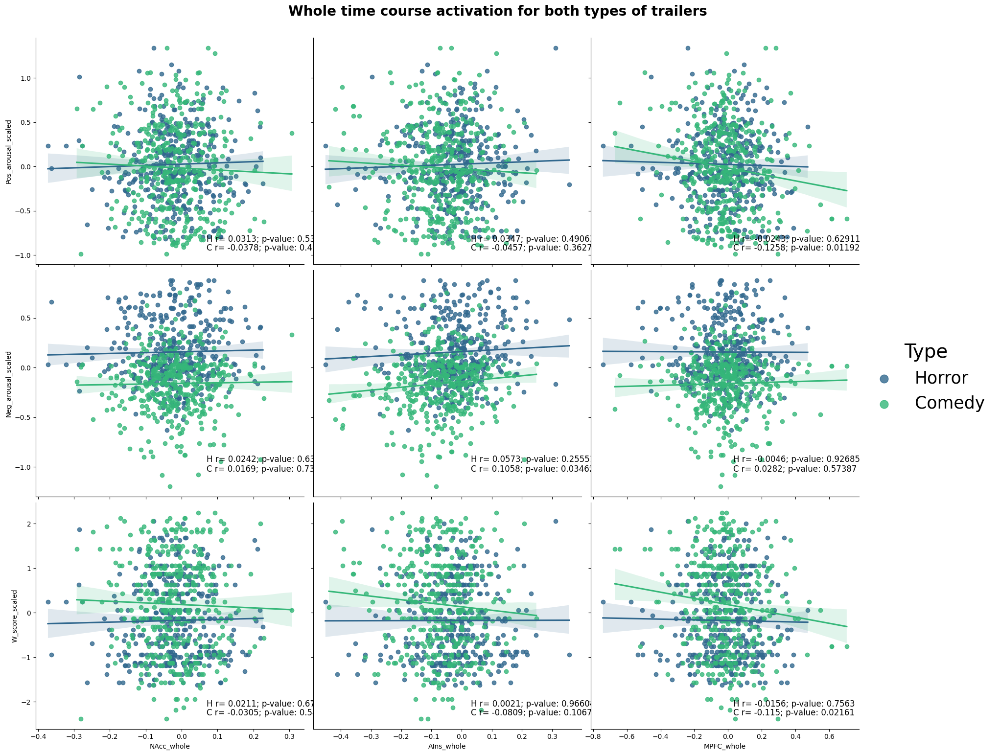

In [80]:
whole_comedy_corr = [NAcc_PA_whole_C_corr, NAcc_NA_whole_C_corr, NAcc_W_whole_C_corr, AIns_PA_whole_C_corr, AIns_NA_whole_C_corr, AIns_W_whole_C_corr, MPFC_PA_whole_C_corr, MPFC_NA_whole_C_corr, MPFC_W_whole_C_corr]
whole_horror_corr = [NAcc_PA_whole_H_corr, NAcc_NA_whole_H_corr, NAcc_W_whole_H_corr, AIns_PA_whole_H_corr, AIns_NA_whole_H_corr, AIns_W_whole_H_corr, MPFC_PA_whole_H_corr, MPFC_NA_whole_H_corr, MPFC_W_whole_H_corr]

title_whole = 'Whole time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "whole", whole_comedy_corr, whole_horror_corr, title_whole)

## Neural Activation Offset 

In [81]:
# Correlation with Positive Arousal. 
NAcc_PA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["W_score_scaled"])
AIns_W_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["W_score_scaled"])
MPFC_W_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_All_corr[1])))

For both types of trailers, the correlation between NAcc offset activation and positive arousal is: 0.00742 with a p-value of: 0.8345894312470369
For both types of trailers, the correlation between AIns offset activation and positive arousal is: 0.01218 with a p-value of: 0.7317062518539773
For both types of trailers, the correlation between MPFC offset activation and positive arousal is: -0.03809 with a p-value of: 0.2833705354491716

For both types of trailers, the correlation between NAcc offset activation and negative arousal is: 0.02512 with a p-value of: 0.4794559799072814
For both types of trailers, the correlation between AIns offset activation and negative arousal is: 0.18604 with a p-value of: 1.2666586550356108e-07
For both types of trailers, the correlation between MPFC offset activation and negative arousal is: 0.06138 with a p-value of: 0.08369360642520361

For both types of trailers, the correlation between NAcc offset activation and watch scores is: -0.01065 with a p-va

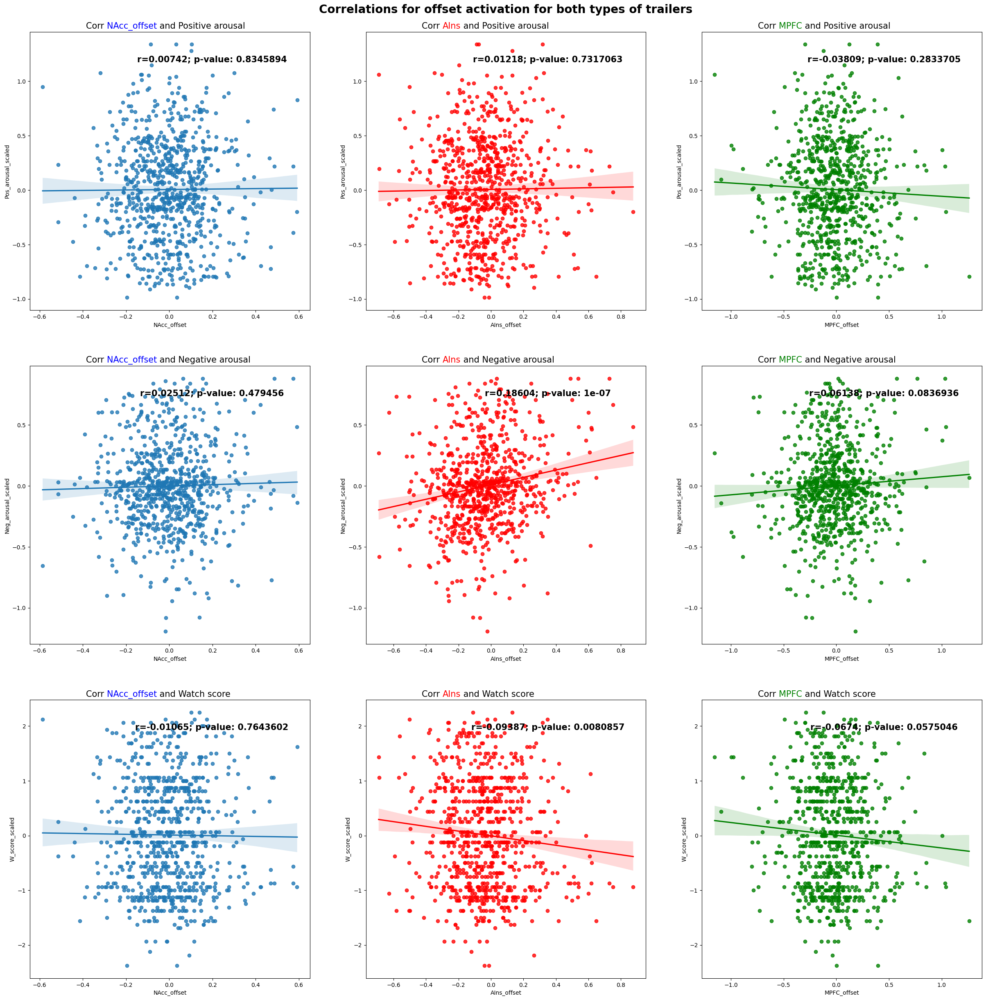

In [82]:
offset_all_corr = [NAcc_PA_Off_All_corr, NAcc_NA_Off_All_corr, NAcc_W_Off_All_corr, AIns_PA_Off_All_corr, AIns_NA_Off_All_corr, AIns_W_Off_All_corr, MPFC_PA_Off_All_corr, MPFC_NA_Off_All_corr, MPFC_W_Off_All_corr]
plot_correlations(all_subs_events_df, offset_all_corr, "offset", "Correlations for offset activation for both types of trailers")

In [83]:
# Offset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_C_corr[1])))
      

For comedy trailers, the correlation between NAcc offset activation and positive arousal is: -0.08362 with a p-value of: 0.095308437520888
For comedy trailers, the correlation between AIns offset activation and positive arousal is: -0.05052 with a p-value of: 0.31414047550421764
For comedy trailers, the correlation between MPFC offset activation and positive arousal is: -0.08666 with a p-value of: 0.0838209959625276

For comedy trailers, the correlation between NAcc offset activation and negative arousal is: -0.01774 with a p-value of: 0.7239522719919843
For comedy trailers, the correlation between AIns offset activation and negative arousal is: 0.08046 with a p-value of: 0.10853819364955747
For comedy trailers, the correlation between MPFC offset activation and negative arousal is: 0.02605 with a p-value of: 0.6039605137111995

For comedy trailers, the correlation between NAcc offset activation and watch scores is: -0.06097 with a p-value of: 0.22428312835062034
For comedy trailers, t

In [84]:
# Offset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["W_score_scaled"])
AIns_W_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_H_corr[1])))

For horror trailers, the correlation between NAcc offset activation and positive arousal is: 0.10916 with a p-value of: 0.029866408819849602
For horror trailers, the correlation between AIns offset activation and positive arousal is: 0.0642 with a p-value of: 0.20238333014139034
For horror trailers, the correlation between MPFC offset activation and positive arousal is: 0.01506 with a p-value of: 0.7651972688020907

For horror trailers, the correlation between NAcc offset activation and negative arousal is: 0.05582 with a p-value of: 0.26782667869635024
For horror trailers, the correlation between AIns offset activation and negative arousal is: 0.15443 with a p-value of: 0.002057155117939607
For horror trailers, the correlation between MPFC offset activation and negative arousal is: 0.05822 with a p-value of: 0.2477047966520897

For horror trailers, the correlation between NAcc offset activation and watch scores is: 0.04975 with a p-value of: 0.3234447669635195
For horror trailers, the

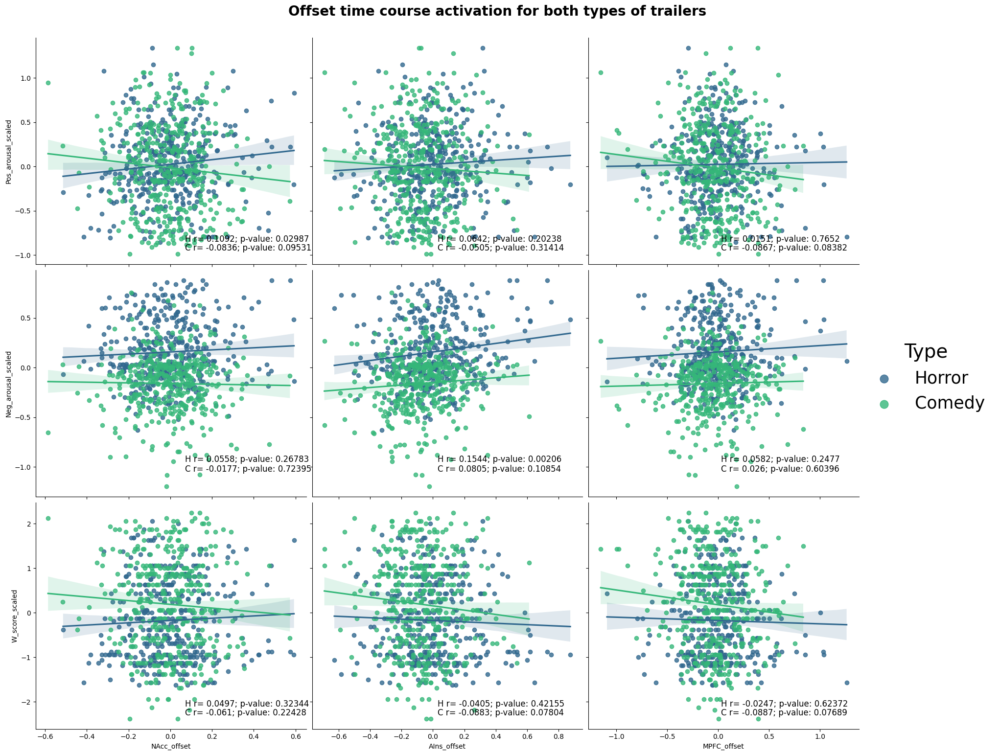

In [85]:
offset_horror_corr = [NAcc_PA_Off_H_corr, NAcc_NA_Off_H_corr, NAcc_W_Off_H_corr, AIns_PA_Off_H_corr, AIns_NA_Off_H_corr, AIns_W_Off_H_corr, MPFC_PA_Off_H_corr, MPFC_NA_Off_H_corr, MPFC_W_Off_H_corr]
offset_comedy_corr = [NAcc_PA_Off_C_corr, NAcc_NA_Off_C_corr, NAcc_W_Off_C_corr, AIns_PA_Off_C_corr, AIns_NA_Off_C_corr, AIns_W_Off_C_corr, MPFC_PA_Off_C_corr, MPFC_NA_Off_C_corr, MPFC_W_Off_C_corr]

title_offset = 'Offset time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "offset", offset_comedy_corr, offset_horror_corr, title_offset)


# Neural activation middle

In [86]:
# Correlation with Positive Arousal.
NAcc_PA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["W_score_scaled"])
AIns_W_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["W_score_scaled"])
MPFC_W_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_All_corr[1])))
      


For both types of trailers, the correlation between NAcc middle activation and positive arousal is: -0.00807 with a p-value of: 0.8202103452122387
For both types of trailers, the correlation between AIns middle activation and positive arousal is: -0.02637 with a p-value of: 0.45787243886284246
For both types of trailers, the correlation between MPFC middle activation and positive arousal is: -0.12202 with a p-value of: 0.0005647474893400067

For both types of trailers, the correlation between NAcc middle activation and negative arousal is: 0.01232 with a p-value of: 0.728683661921546
For both types of trailers, the correlation between AIns middle activation and negative arousal is: 0.0802 with a p-value of: 0.023732363447120822
For both types of trailers, the correlation between MPFC middle activation and negative arousal is: -0.03309 with a p-value of: 0.35146234656261766

For both types of trailers, the correlation between NAcc middle activation and watch scores is: -0.00131 with a p

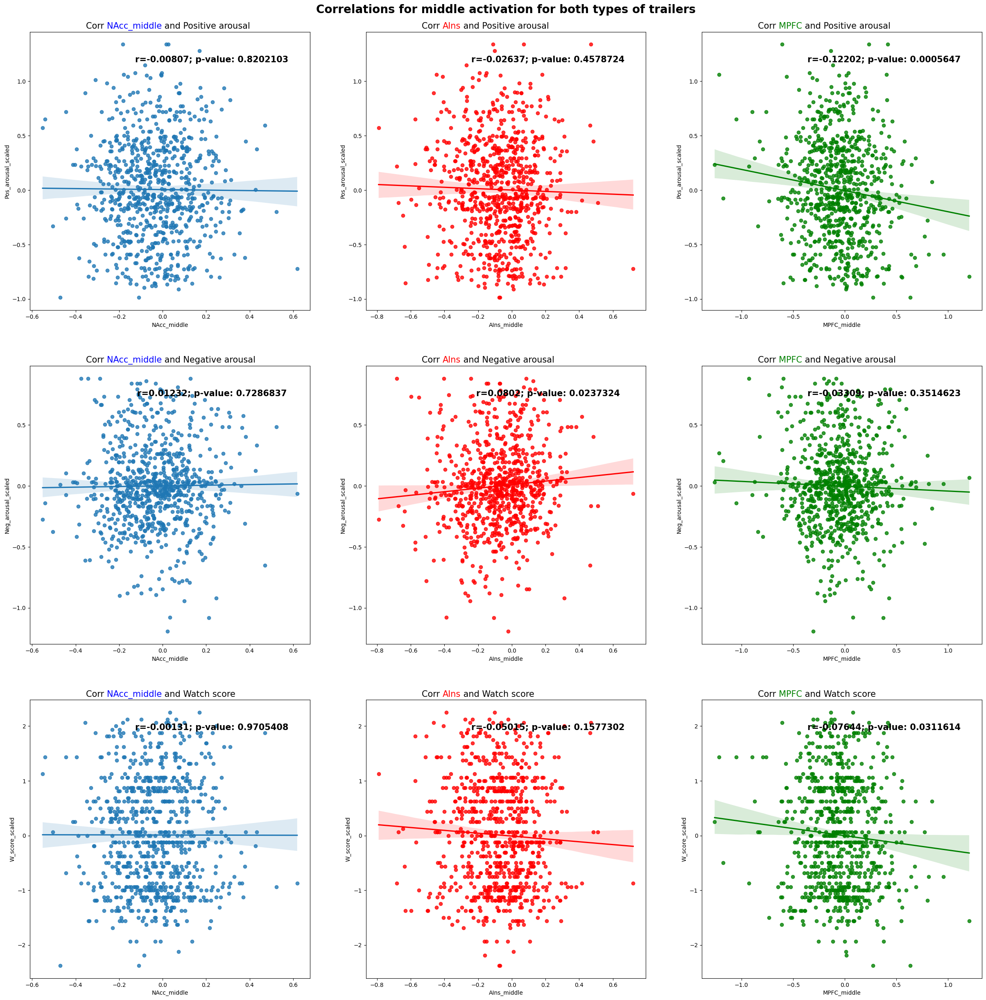

In [87]:
Mid_all_corr = [NAcc_PA_Mid_All_corr, NAcc_NA_Mid_All_corr, NAcc_W_Mid_All_corr, AIns_PA_Mid_All_corr, AIns_NA_Mid_All_corr, AIns_W_Mid_All_corr, MPFC_PA_Mid_All_corr, MPFC_NA_Mid_All_corr, MPFC_W_Mid_All_corr]
plot_correlations(all_subs_events_df, Mid_all_corr, "middle", "Correlations for middle activation for both types of trailers")

In [88]:
# Middle Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_C_corr[1])))


For comedy trailers, the correlation between NAcc middle activation and positive arousal is: -0.01414 with a p-value of: 0.7782423170232282
For comedy trailers, the correlation between AIns middle activation and positive arousal is: -0.04684 with a p-value of: 0.3506644887423933
For comedy trailers, the correlation between MPFC middle activation and positive arousal is: -0.13077 with a p-value of: 0.008915995137134558

For comedy trailers, the correlation between NAcc middle activation and negative arousal is: -0.00046 with a p-value of: 0.9927406284532175
For comedy trailers, the correlation between AIns middle activation and negative arousal is: 0.06936 with a p-value of: 0.16672952162140842
For comedy trailers, the correlation between MPFC middle activation and negative arousal is: -0.02263 with a p-value of: 0.6522024147735594

For comedy trailers, the correlation between NAcc middle activation and watch scores is: -0.00128 with a p-value of: 0.9796781640619445
For comedy trailers,

In [89]:
# Middle Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["W_score_scaled"])
AIns_W_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_H_corr[1])))

For horror trailers, the correlation between NAcc middle activation and positive arousal is: -0.00192 with a p-value of: 0.9696464796327924
For horror trailers, the correlation between AIns middle activation and positive arousal is: -0.01663 with a p-value of: 0.7415320725488126
For horror trailers, the correlation between MPFC middle activation and positive arousal is: -0.11276 with a p-value of: 0.02483717716019876

For horror trailers, the correlation between NAcc middle activation and negative arousal is: 0.01178 with a p-value of: 0.8152153759892551
For horror trailers, the correlation between AIns middle activation and negative arousal is: -0.04575 with a p-value of: 0.36388813847760215
For horror trailers, the correlation between MPFC middle activation and negative arousal is: -0.03971 with a p-value of: 0.430684012537427

For horror trailers, the correlation between NAcc middle activation and watch scores is: 0.00522 with a p-value of: 0.9175124281131583
For horror trailers, th

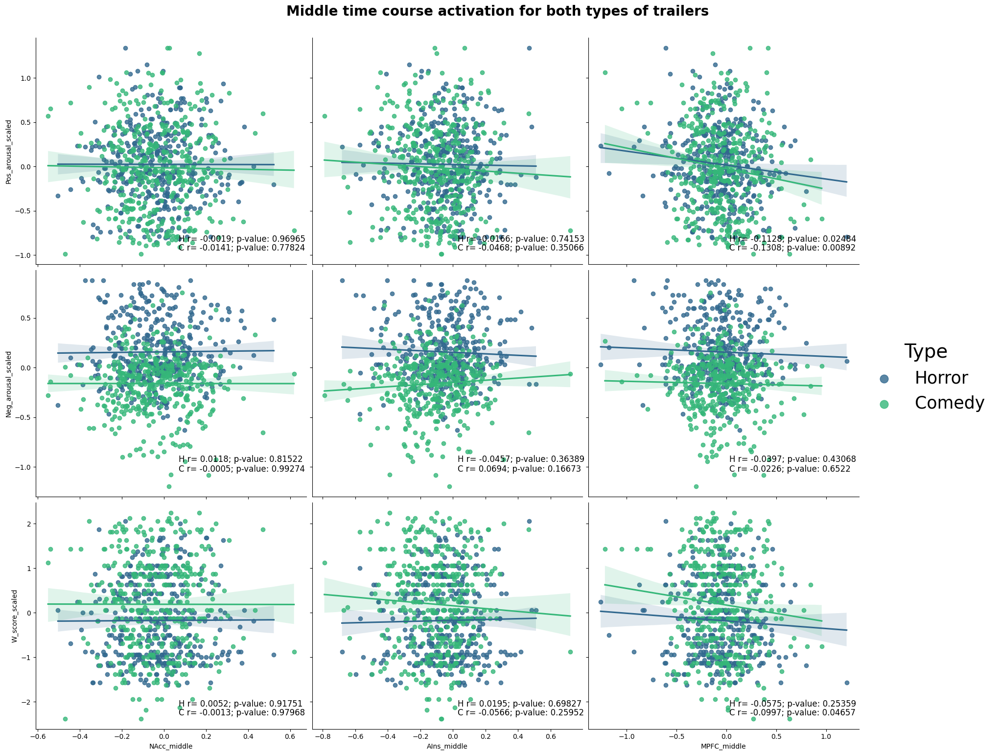

In [90]:
Mid_horror_corr = [NAcc_PA_Mid_H_corr, NAcc_NA_Mid_H_corr, NAcc_W_Mid_H_corr, AIns_PA_Mid_H_corr, AIns_NA_Mid_H_corr, AIns_W_Mid_H_corr, MPFC_PA_Mid_H_corr, MPFC_NA_Mid_H_corr, MPFC_W_Mid_H_corr]
Mid_comedy_corr = [NAcc_PA_Mid_C_corr, NAcc_NA_Mid_C_corr, NAcc_W_Mid_C_corr, AIns_PA_Mid_C_corr, AIns_NA_Mid_C_corr, AIns_W_Mid_C_corr, MPFC_PA_Mid_C_corr, MPFC_NA_Mid_C_corr, MPFC_W_Mid_C_corr]

title_middle = 'Middle time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "middle", Mid_comedy_corr, Mid_horror_corr, title_middle)

## Neural activation onset

In [91]:
# Correlation with Positive Arousal.
NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

For both types of trailers, the correlation between NAcc onset activation and positive arousal is: -0.00892 with a p-value of: 0.8017626645160318
For both types of trailers, the correlation between AIns onset activation and positive arousal is: 0.01188 with a p-value of: 0.7380729201205148
For both types of trailers, the correlation between MPFC onset activation and positive arousal is: 0.01452 with a p-value of: 0.682735776444903

For both types of trailers, the correlation between NAcc onset activation and negative arousal is: -0.00793 with a p-value of: 0.8233565053190289
For both types of trailers, the correlation between AIns onset activation and negative arousal is: 0.00827 with a p-value of: 0.8158298420949511
For both types of trailers, the correlation between MPFC onset activation and negative arousal is: -0.01685 with a p-value of: 0.6352087656150712

For both types of trailers, the correlation between NAcc onset activation and watch scores is: 0.00191 with a p-value of: 0.95

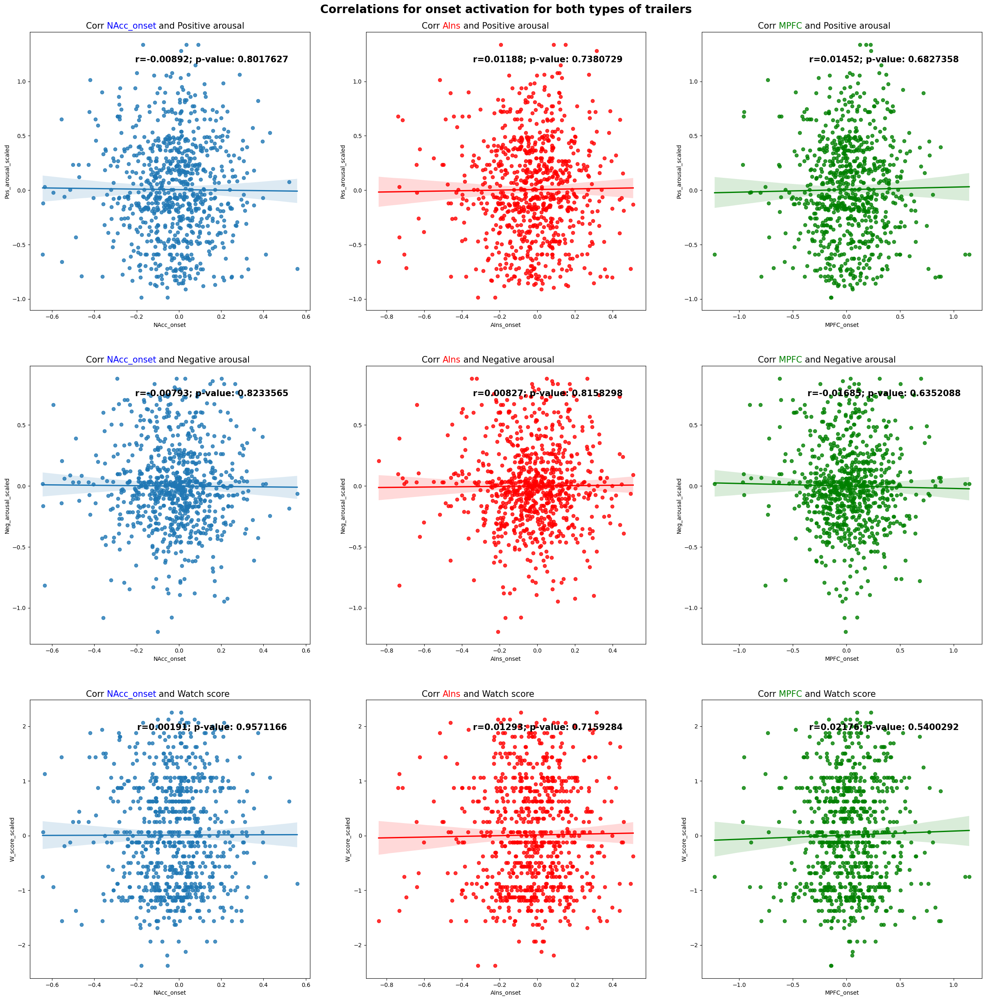

In [92]:
On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

In [93]:
# Onset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

For comedy trailers, the correlation between NAcc onset activation and positive arousal is: 0.03322 with a p-value of: 0.5081938686102989
For comedy trailers, the correlation between AIns onset activation and positive arousal is: 0.01983 with a p-value of: 0.6929841333027886
For comedy trailers, the correlation between MPFC onset activation and positive arousal is: -0.01545 with a p-value of: 0.7583478861158062

For comedy trailers, the correlation between NAcc onset activation and negative arousal is: 0.04426 with a p-value of: 0.3779040132852137
For comedy trailers, the correlation between AIns onset activation and negative arousal is: 0.03012 with a p-value of: 0.5485456073598277
For comedy trailers, the correlation between MPFC onset activation and negative arousal is: 0.04928 with a p-value of: 0.32620463434830194

For comedy trailers, the correlation between NAcc onset activation and watch scores is: 0.01049 with a p-value of: 0.8345033506950332
For comedy trailers, the correlati

In [94]:
# Onset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

For horror trailers, the correlation between NAcc onset activation and positive arousal is: -0.05621 with a p-value of: 0.26446925213576633
For horror trailers, the correlation between AIns onset activation and positive arousal is: 0.00014 with a p-value of: 0.99778304967255
For horror trailers, the correlation between MPFC onset activation and positive arousal is: 0.05521 with a p-value of: 0.27303173207335707

For horror trailers, the correlation between NAcc onset activation and negative arousal is: -0.02731 with a p-value of: 0.5879823833491715
For horror trailers, the correlation between AIns onset activation and negative arousal is: -0.03793 with a p-value of: 0.4515861028162873
For horror trailers, the correlation between MPFC onset activation and negative arousal is: -0.02606 with a p-value of: 0.6051402423851945

For horror trailers, the correlation between NAcc onset activation and watch scores is: -0.02026 with a p-value of: 0.6877978024301499
For horror trailers, the correl

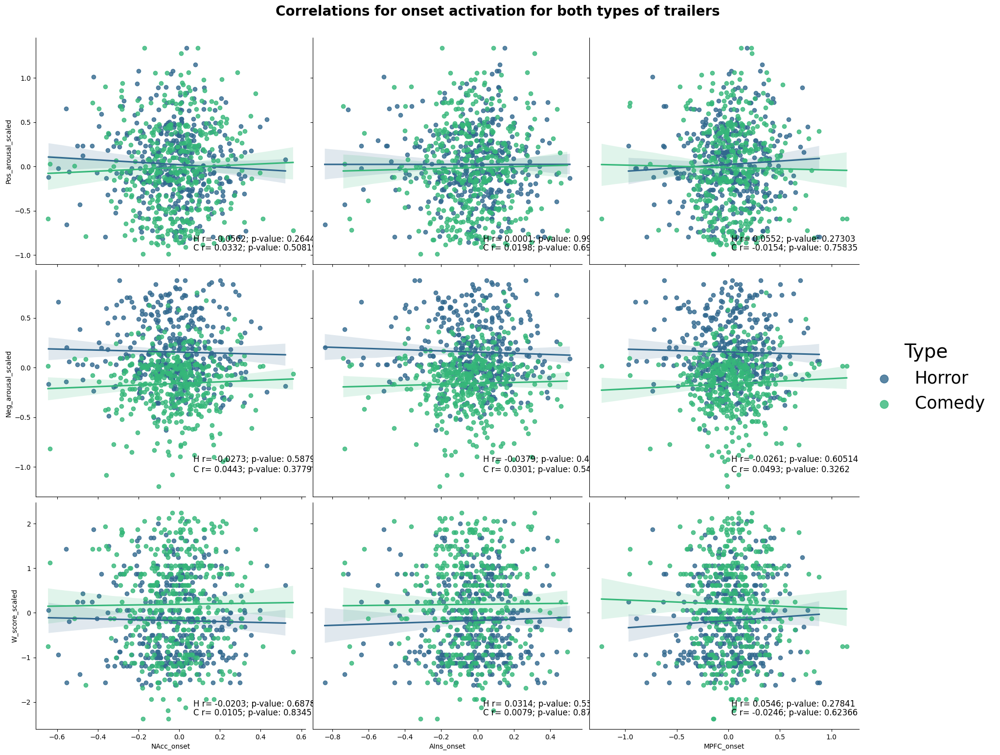

In [95]:
On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



## Peak Max

In [96]:
# Correlation with Positive Arousal.
NAcc_PA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_All_corr[1])))
      



For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.01183 with a p-value of: 0.7390336339686221
For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: 0.00833 with a p-value of: 0.8146022922606224
For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.05858 with a p-value of: 0.09883144262410767

For both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.00888 with a p-value of: 0.8027034233054274
For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: 0.11737 with a p-value of: 0.0009147278186673638
For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.02808 with a p-value of: 0.4291183024890437

For both types of trailers, the correlation between NAcc positive peak acti

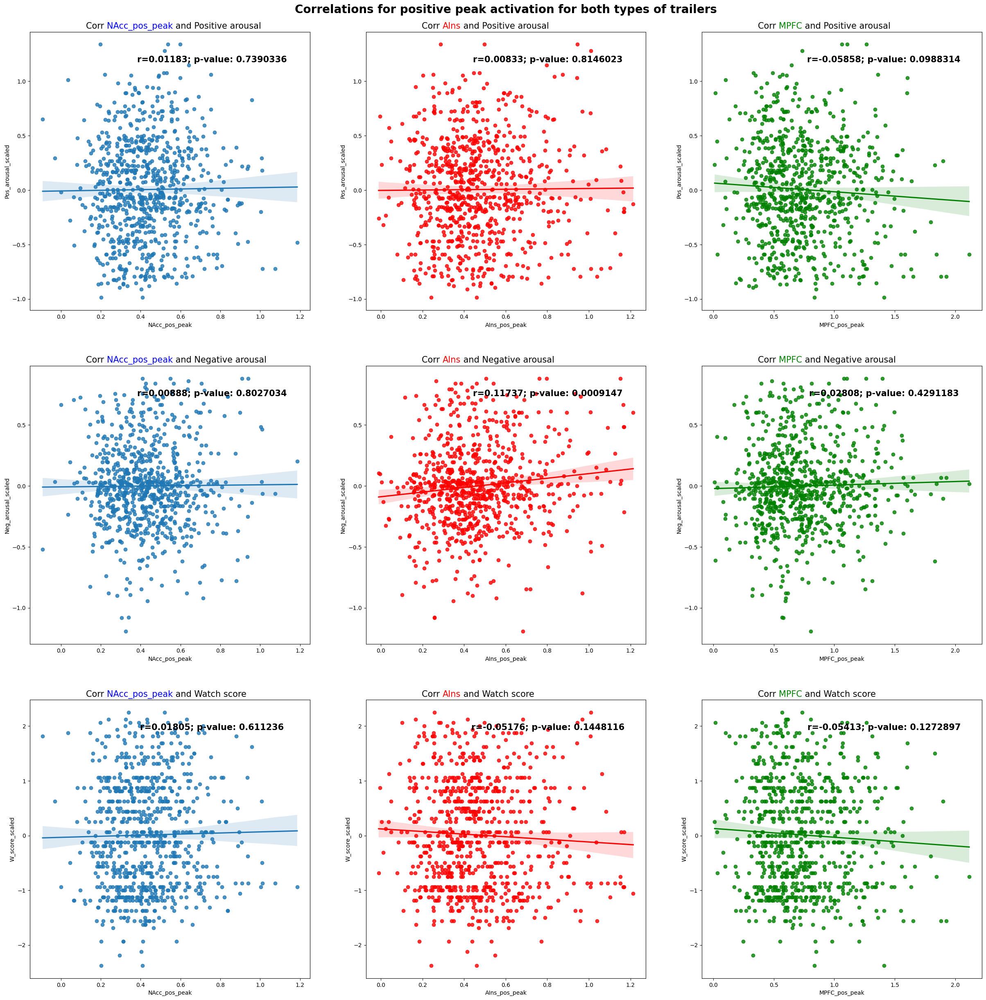

In [97]:
Pmax_all_corr = [NAcc_PA_Pmax_All_corr, NAcc_NA_Pmax_All_corr, NAcc_W_Pmax_All_corr, AIns_PA_Pmax_All_corr, AIns_NA_Pmax_All_corr, AIns_W_Pmax_All_corr, MPFC_PA_Pmax_All_corr, MPFC_NA_Pmax_All_corr, MPFC_W_Pmax_All_corr]
plot_correlations(all_subs_events_df, Pmax_all_corr, "pos_peak", "Correlations for positive peak activation for both types of trailers")


In [98]:
# Pos peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_C_corr[1])))
      
      


For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.03257 with a p-value of: 0.516572478403638
For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: -0.00344 with a p-value of: 0.9454083544639977
For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.05065 with a p-value of: 0.31284618918508084

For comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: -0.08373 with a p-value of: 0.0948911056285014
For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: 0.00949 with a p-value of: 0.8501378725595453
For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.04421 with a p-value of: 0.37844481974838123

For comedy trailers, the correlation between NAcc positive peak activation and watch scores is: 0.07972 with a p-value

In [99]:
# Pos peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_H_corr[1])))


For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: -0.01313 with a p-value of: 0.7944322082869167
For horror trailers, the correlation between AIns positive peak activation and positive arousal is: 0.01182 with a p-value of: 0.8146710455017474
For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.06815 with a p-value of: 0.17590158147748577

For horror trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.10101 with a p-value of: 0.04454153983562517
For horror trailers, the correlation between AIns positive peak activation and negative arousal is: 0.1262 with a p-value of: 0.011952574044817338
For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.03149 with a p-value of: 0.5320752541609857

For horror trailers, the correlation between NAcc positive peak activation and watch scores is: -0.05736 with a p-val

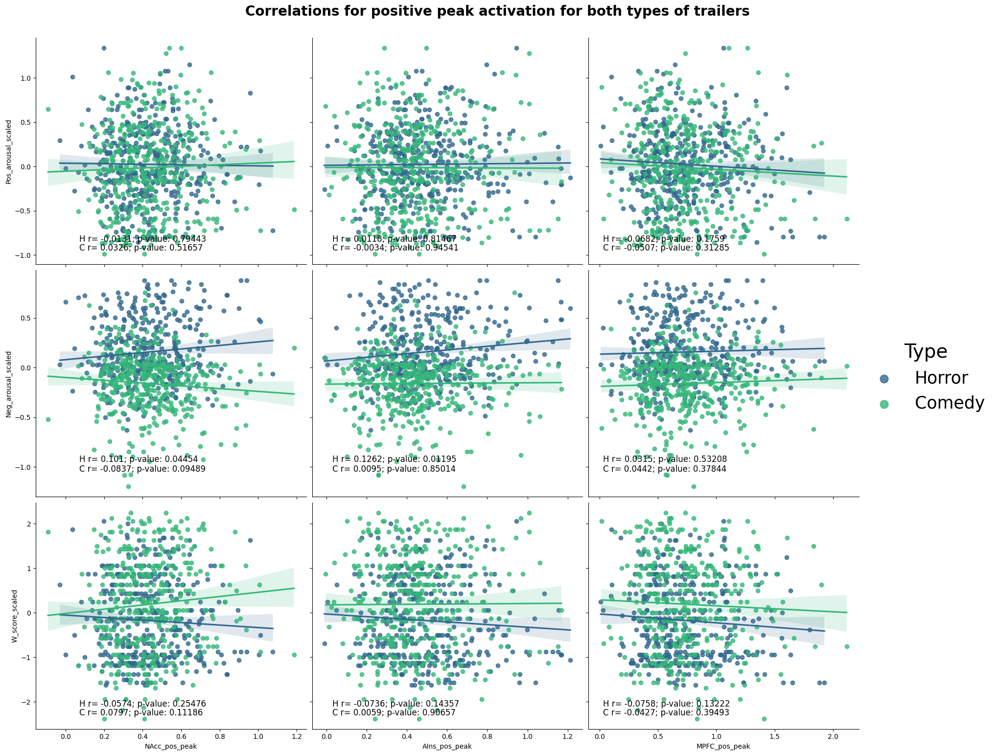

In [100]:
Pmax_comedy_corr = [NAcc_PA_Pmax_C_corr, NAcc_NA_Pmax_C_corr, NAcc_W_Pmax_C_corr, AIns_PA_Pmax_C_corr, AIns_NA_Pmax_C_corr, AIns_W_Pmax_C_corr, MPFC_PA_Pmax_C_corr, MPFC_NA_Pmax_C_corr, MPFC_W_Pmax_C_corr]
Pmax_horror_corr = [NAcc_PA_Pmax_H_corr, NAcc_NA_Pmax_H_corr, NAcc_W_Pmax_H_corr, AIns_PA_Pmax_H_corr, AIns_NA_Pmax_H_corr, AIns_W_Pmax_H_corr, MPFC_PA_Pmax_H_corr, MPFC_NA_Pmax_H_corr, MPFC_W_Pmax_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "pos_peak", Pmax_comedy_corr, Pmax_horror_corr, "Correlations for positive peak activation for both types of trailers")

## Peak min

In [101]:
# Correlation with Positive Arousal.
NAcc_PA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_All_corr[1])))
      
      

For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.04079 with a p-value of: 0.2506871355369484
For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: 0.01104 with a p-value of: 0.7560532167110176
For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.01434 with a p-value of: 0.6864011310357504

For both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.02387 with a p-value of: 0.5014531418302325
For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: 0.04899 with a p-value of: 0.1675976821681042
For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.05659 with a p-value of: 0.11087017728570754

For both types of trailers, the correlation between NAcc negative peak activa

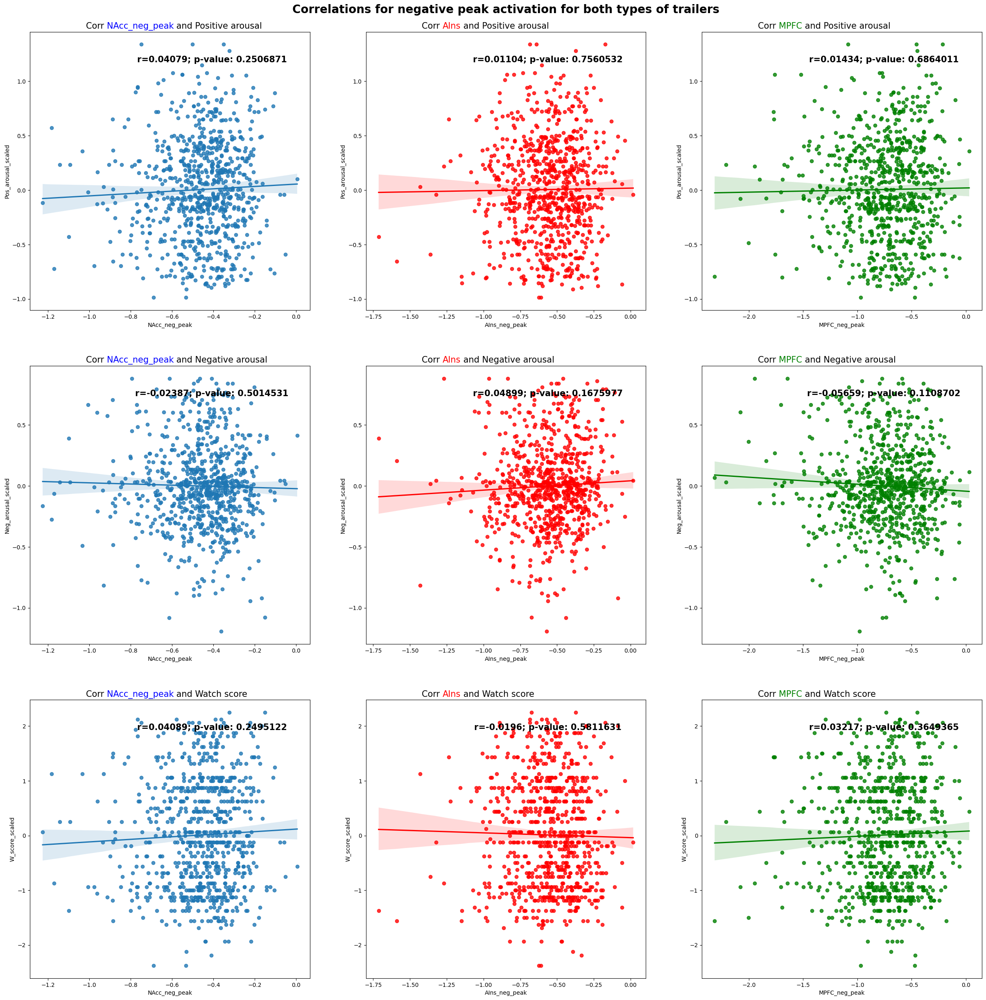

In [102]:
Pmin_all_corr = [NAcc_PA_Pmin_All_corr, NAcc_NA_Pmin_All_corr, NAcc_W_Pmin_All_corr, AIns_PA_Pmin_All_corr, AIns_NA_Pmin_All_corr, AIns_W_Pmin_All_corr, MPFC_PA_Pmin_All_corr, MPFC_NA_Pmin_All_corr, MPFC_W_Pmin_All_corr]
plot_correlations(all_subs_events_df, Pmin_all_corr, "neg_peak", "Correlations for negative peak activation for both types of trailers")

In [103]:
# Neg peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_C_corr[1])))


For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: -0.02689 with a p-value of: 0.5923329338998579
For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: -0.0108 with a p-value of: 0.8296497671847198
For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: -0.05397 with a p-value of: 0.2821545738679554

For comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: 0.08251 with a p-value of: 0.09981799321375823
For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: 0.07757 with a p-value of: 0.12189814017641268
For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.03294 with a p-value of: 0.511779573548805

For comedy trailers, the correlation between NAcc negative peak activation and watch scores is: -0.05781 with a p-valu

In [104]:
# Neg peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_H_corr[1])))
      

For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.12479 with a p-value of: 0.012946959025427912
For horror trailers, the correlation between AIns negative peak activation and positive arousal is: 0.02773 with a p-value of: 0.5821270558016944
For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.0928 with a p-value of: 0.0650665203848367

For horror trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.07063 with a p-value of: 0.16069363090279548
For horror trailers, the correlation between AIns negative peak activation and negative arousal is: -0.06655 with a p-value of: 0.18629269592078812
For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.08486 with a p-value of: 0.09170943430991518

For horror trailers, the correlation between NAcc negative peak activation and watch scores is: 0.13421 with a p-va

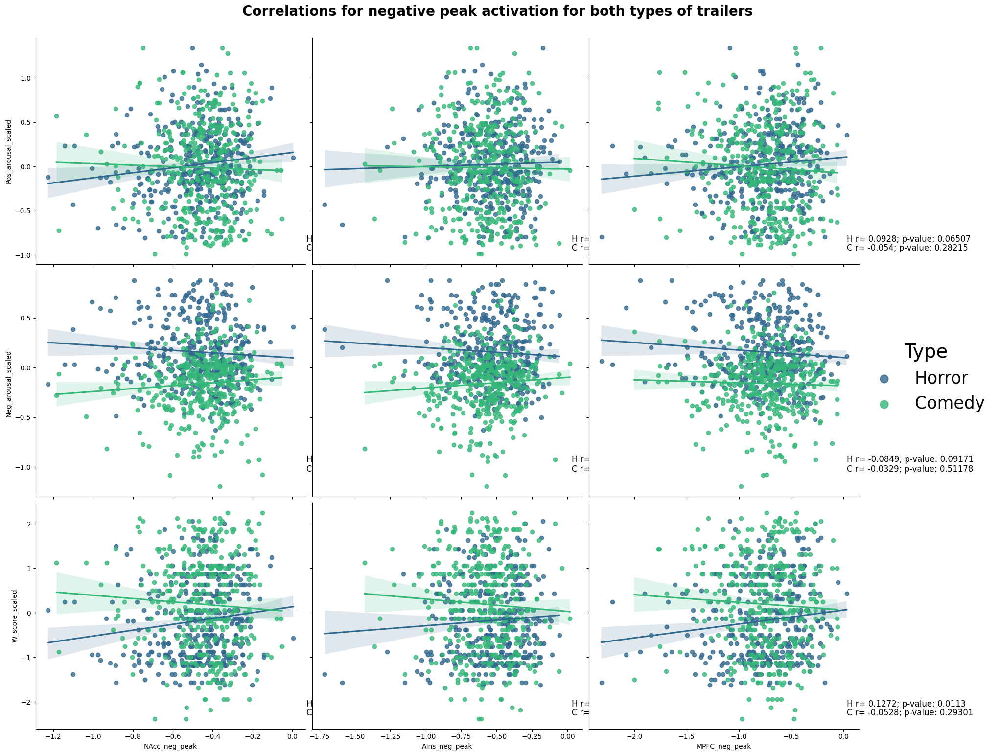

In [105]:
Pmin_comedy_corr = [NAcc_PA_Pmin_C_corr, NAcc_NA_Pmin_C_corr, NAcc_W_Pmin_C_corr, AIns_PA_Pmin_C_corr, AIns_NA_Pmin_C_corr, AIns_W_Pmin_C_corr, MPFC_PA_Pmin_C_corr, MPFC_NA_Pmin_C_corr, MPFC_W_Pmin_C_corr]
Pmin_horror_corr = [NAcc_PA_Pmin_H_corr, NAcc_NA_Pmin_H_corr, NAcc_W_Pmin_H_corr, AIns_PA_Pmin_H_corr, AIns_NA_Pmin_H_corr, AIns_W_Pmin_H_corr, MPFC_PA_Pmin_H_corr, MPFC_NA_Pmin_H_corr, MPFC_W_Pmin_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "neg_peak", Pmin_comedy_corr, Pmin_horror_corr, "Correlations for negative peak activation for both types of trailers")

## Absolute peak 

In [106]:
# Correlation with Positive Arousal.
NAcc_PA_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pabs_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pabs_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pabs_All_corr[1])))

      

For both types of trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.05629 with a p-value of: 0.11273860337553235
For both types of trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.0432 with a p-value of: 0.22374312957324474
For both types of trailers, the correlation between MPFC absolute peak activation and positive arousal is: -0.01966 with a p-value of: 0.579839151837832

For both types of trailers, the correlation between NAcc absolute peak activation and negative arousal is: 0.00041 with a p-value of: 0.9907087777042418
For both types of trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.08335 with a p-value of: 0.018745217081499094
For both types of trailers, the correlation between MPFC absolute peak activation and negative arousal is: -0.00319 with a p-value of: 0.9285332791490164

For both types of trailers, the correlation between NAcc absolute peak activ

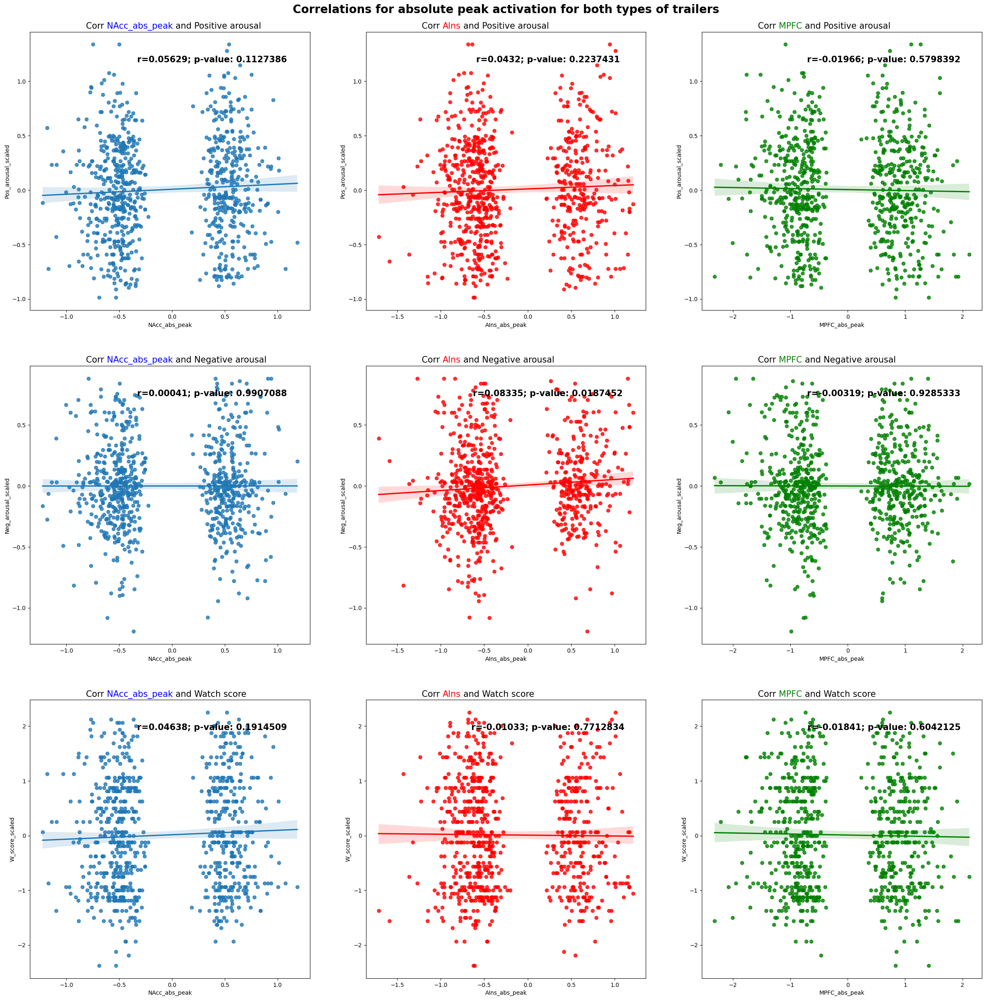

In [107]:
Pabs_all_corr = [NAcc_PA_Pabs_All_corr, NAcc_NA_Pabs_All_corr, NAcc_W_Pabs_All_corr, AIns_PA_Pabs_All_corr, AIns_NA_Pabs_All_corr, AIns_W_Pabs_All_corr, MPFC_PA_Pabs_All_corr, MPFC_NA_Pabs_All_corr, MPFC_W_Pabs_All_corr]
plot_correlations(all_subs_events_df, Pabs_all_corr, "abs_peak", "Correlations for absolute peak activation for both types of trailers")

In [108]:
NAcc_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Pabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Pabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Pabs_comedy_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Nabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Nabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Nabs_comedy_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Wabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Wabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Wabs_comedy_corr[1])))
      

For comedy trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.0182 with a p-value of: 0.7170118075654383
For comedy trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.04182 with a p-value of: 0.40479327071331117
For comedy trailers, the correlation between MPFC absolute peak activation and positive arousal is: -0.06178 with a p-value of: 0.21815516976790547

For comedy trailers, the correlation between NAcc absolute peak activation and negative arousal is: 0.01223 with a p-value of: 0.8075283615679741
For comedy trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.05197 with a p-value of: 0.30037418800993804
For comedy trailers, the correlation between MPFC absolute peak activation and negative arousal is: 0.03939 with a p-value of: 0.43261310442515605

For comedy trailers, the correlation between NAcc absolute peak activation and watch scores is: 0.01611 with a p-value

In [109]:
NAcc_Pabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_Pabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_Pabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_Nabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_Nabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_Nabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_Wabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["W_score_scaled"])
AIns_Wabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_Wabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Pabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Pabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Pabs_horror_corr[1])))

print("\nFor horror trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Nabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Nabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Nabs_horror_corr[1])))

print("\nFor horror trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Wabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Wabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Wabs_horror_corr[1])))

For horror trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.10633 with a p-value of: 0.034414862361081225
For horror trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.0335 with a p-value of: 0.5062014127612995
For horror trailers, the correlation between MPFC absolute peak activation and positive arousal is: 0.03238 with a p-value of: 0.5205524031477997

For horror trailers, the correlation between NAcc absolute peak activation and negative arousal is: 0.02141 with a p-value of: 0.6710614572262673
For horror trailers, the correlation between AIns absolute peak activation and negative arousal is: -0.01514 with a p-value of: 0.7638928027274712
For horror trailers, the correlation between MPFC absolute peak activation and negative arousal is: -0.04064 with a p-value of: 0.4200078606984106

For horror trailers, the correlation between NAcc absolute peak activation and watch scores is: 0.07182 with a p-value 

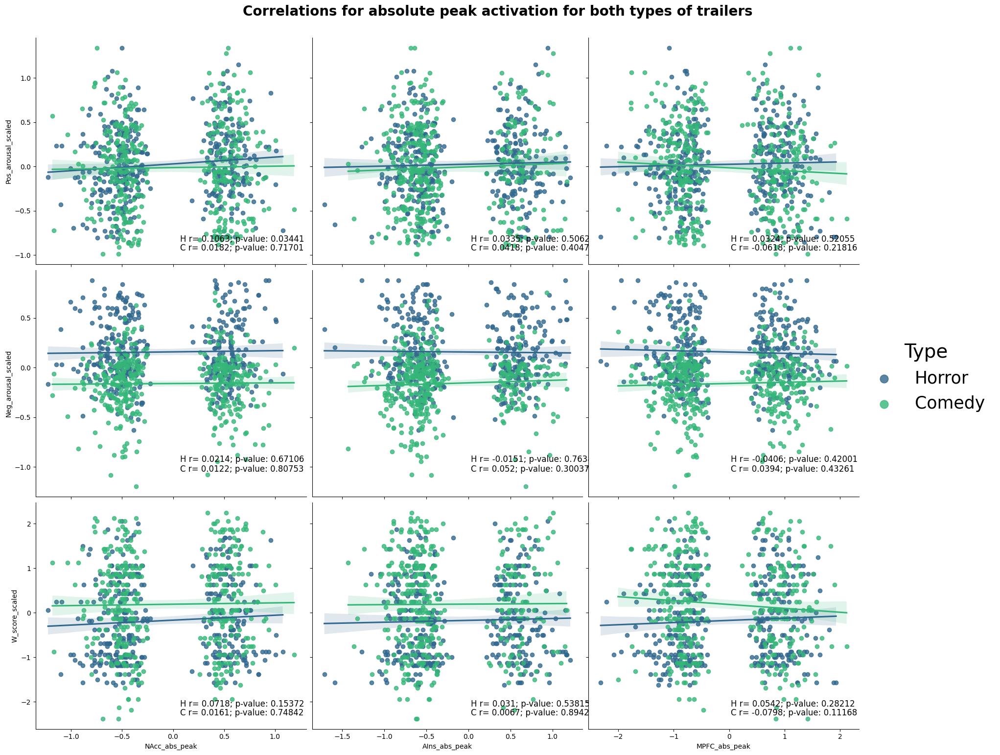

In [110]:
Pabs_comedy_corr = [NAcc_Pabs_comedy_corr, NAcc_Nabs_comedy_corr, NAcc_Wabs_comedy_corr, AIns_Pabs_comedy_corr, AIns_Nabs_comedy_corr, AIns_Wabs_comedy_corr, MPFC_Pabs_comedy_corr, MPFC_Nabs_comedy_corr, MPFC_Wabs_comedy_corr]
Pabs_horror_corr = [NAcc_Pabs_horror_corr, NAcc_Nabs_horror_corr, NAcc_Wabs_horror_corr, AIns_Pabs_horror_corr, AIns_Nabs_horror_corr, AIns_Wabs_horror_corr, MPFC_Pabs_horror_corr, MPFC_Nabs_horror_corr, MPFC_Wabs_horror_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "abs_peak", Pabs_comedy_corr, Pabs_horror_corr, "Correlations for absolute peak activation for both types of trailers")

## Neural ISC

In [111]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.05723 with a p-value of: 0.10684942841138029
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.03523 with a p-value of: 0.3210924592630082
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.12375 with a p-value of: 0.0004700915789132068

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.03172 with a p-value of: 0.37169739713420236
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.04537 with a p-value of: 0.20131029530696773
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: -0.036 with a p-value of: 0.31073258585624186

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.06447 with a p-value of: 0.0692661396

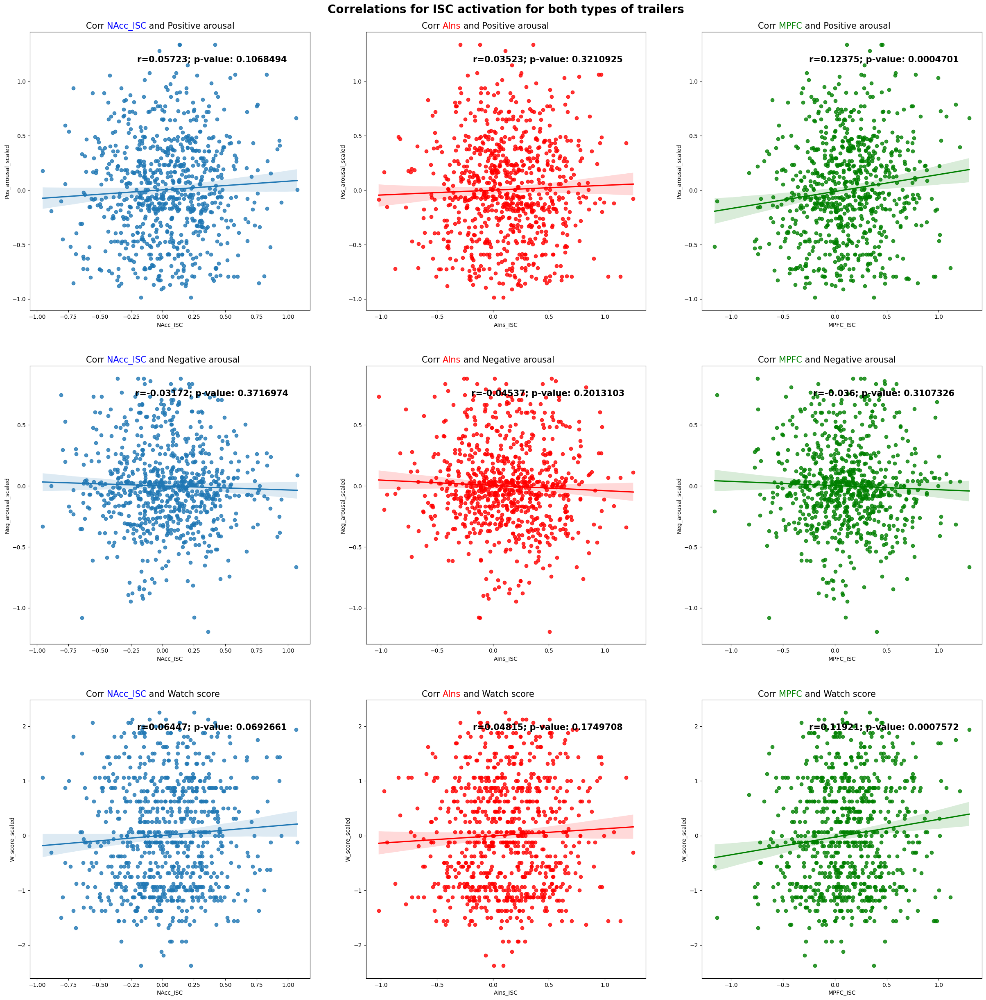

In [112]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [113]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.11497 with a p-value of: 0.021616952940521725
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.1245 with a p-value of: 0.0128177224339131
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.16033 with a p-value of: 0.001312112395346537

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: 4e-05 with a p-value of: 0.9993987166133362
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.09106 with a p-value of: 0.0692113816319324
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: -0.01983 with a p-value of: 0.6928941406490026

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.10129 with a p-value of: 0.0431577168052484
For comedy trailers, the correlation between AI

In [114]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.01631 with a p-value of: 0.7462978365687838
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.06661 with a p-value of: 0.18591759748779696
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.08102 with a p-value of: 0.10742248879602737

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.07236 with a p-value of: 0.15065816335292895
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.034 with a p-value of: 0.499880758622962
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: -0.04982 with a p-value of: 0.3227000887402339

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.02158 with a p-value of: 0.6686068710390398
For horror trailers, the correlation between A

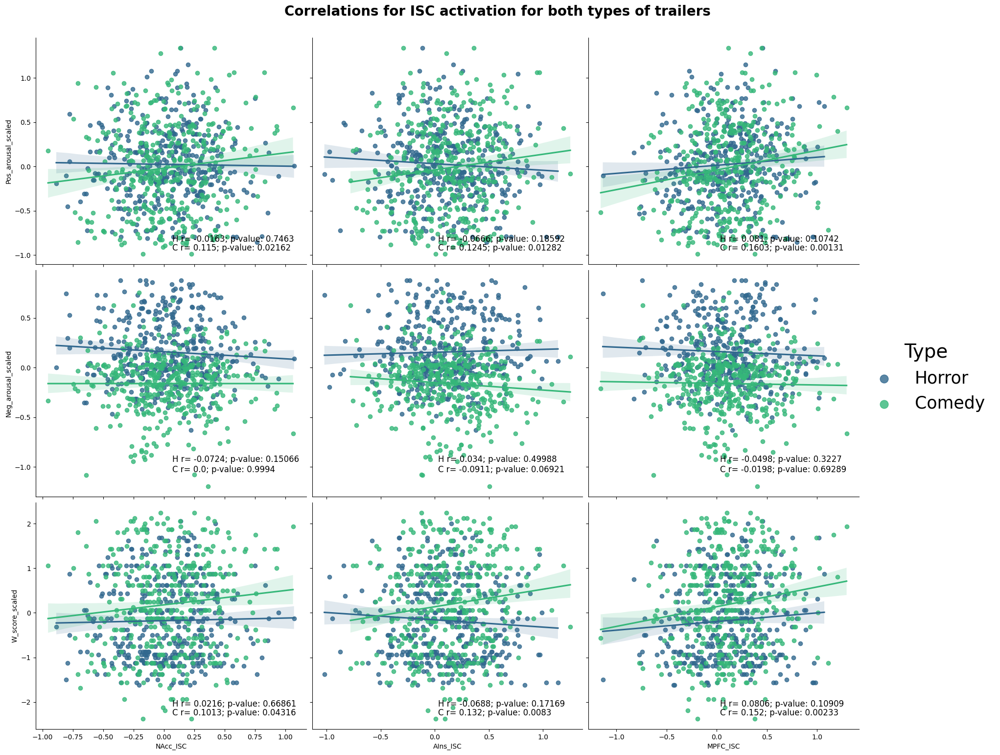

In [115]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [116]:
"""
# Not used. 
def corrfunc(x, y, **kws):
    print(x)
    r, _ = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9
"""

'\n# Not used. \ndef corrfunc(x, y, **kws):\n    print(x)\n    r, _ = pearsonr(x, y)\n    ax = plt.gca()\n    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9\n'